In [1]:
import opendatasets as od
od.download('https://www.kaggle.com/competitions/2019-2nd-ml-month-with-kakr/data')

Skipping, found downloaded files in "./2019-2nd-ml-month-with-kakr" (use force=True to force download)


# Dataset Description

- File Descripption
  - train.csv - 예측 모델을 만들기 위해 사용하는 학습 데이터입니다. 집의 정보와 예측할 변수인 가격(Price) 변수를 가지고 있습니다.
  - test.csv - 학습셋으로 만든 모델을 가지고 예측할 가격(Price) 변수를 제외한 집의 정보가 담긴 테스트 데이터 입니다.
  - sample_submission.csv - 제출시 사용할 수 있는 예시 submission.csv 파일입니다.

- Data Fileds
  - ID : 집을 구분하는 번호
  - date : 집을 구매한 날짜
  - price : 집의 가격(Target variable)
  - bedrooms : 침실의 수
  - bathrooms : 화장실의 수
  - sqft_living : 주거 공간의 평방 피트(면적)
  - sqft_lot : 부지의 평방 피트(면적)
  - floors : 집의 층 수
  - waterfront : 집의 전방에 강이 흐르는지 유무 (a.k.a. 리버뷰)
  - view : 집이 얼마나 좋아 보이는지의 정도
  - condition : 집의 전반적인 상태
  - grade : King County grading 시스템 기준으로 매긴 집의 등급
  - sqft_above : 지하실을 제외한 평방 피트(면적)
  - sqft_basement : 지하실의 평방 피트(면적)
  - yr_built : 지어진 년도
  - yr_renovated : 집을 재건축한 년도
  - zipcode : 우편번호
  - lat : 위도
  - long : 경도
  - sqft_living15 : 주거지 기준 15개 면적의 평균(평방 피트)
  - sqft_lot15 : 주거지 기준 15개 면적의 평균(대지면적)

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import missingno as msno
import os
import sys
import warnings

warnings.filterwarnings('ignore')
pd.options.display.max_columns = 30
pd.options.display.float_format = '{:.2f}'.format

In [3]:
train_df = pd.read_csv('./2019-2nd-ml-month-with-kakr/train.csv')
test_df = pd.read_csv('test.csv')
submission = pd.read_csv('./2019-2nd-ml-month-with-kakr/sample_submission.csv')

In [4]:
print('train df shape: ', train_df.shape)
print('test df shape: ',test_df.shape)

train df shape:  (15035, 21)
test df shape:  (6468, 20)


In [5]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15035 entries, 0 to 15034
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             15035 non-null  int64  
 1   date           15035 non-null  object 
 2   price          15035 non-null  float64
 3   bedrooms       15035 non-null  int64  
 4   bathrooms      15035 non-null  float64
 5   sqft_living    15035 non-null  int64  
 6   sqft_lot       15035 non-null  int64  
 7   floors         15035 non-null  float64
 8   waterfront     15035 non-null  int64  
 9   view           15035 non-null  int64  
 10  condition      15035 non-null  int64  
 11  grade          15035 non-null  int64  
 12  sqft_above     15035 non-null  int64  
 13  sqft_basement  15035 non-null  int64  
 14  yr_built       15035 non-null  int64  
 15  yr_renovated   15035 non-null  int64  
 16  zipcode        15035 non-null  int64  
 17  lat            15035 non-null  float64
 18  long  

In [6]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6468 entries, 0 to 6467
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             6468 non-null   int64  
 1   date           6468 non-null   object 
 2   bedrooms       6468 non-null   int64  
 3   bathrooms      6468 non-null   float64
 4   sqft_living    6468 non-null   int64  
 5   sqft_lot       6468 non-null   int64  
 6   floors         6468 non-null   float64
 7   waterfront     6468 non-null   int64  
 8   view           6468 non-null   int64  
 9   condition      6468 non-null   int64  
 10  grade          6468 non-null   int64  
 11  sqft_above     6468 non-null   int64  
 12  sqft_basement  6468 non-null   int64  
 13  yr_built       6468 non-null   int64  
 14  yr_renovated   6468 non-null   int64  
 15  zipcode        6468 non-null   int64  
 16  lat            6468 non-null   float64
 17  long           6468 non-null   float64
 18  sqft_liv

---

# 1. EDA

In [7]:
eda_df = train_df.copy()

In [8]:
eda_df.head(10)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,0,20141013T000000,221900.00,3,1.00,1180,5650,1.00,0,0,3,7,1180,0,1955,0,98178,47.51,-122.26,1340,5650
1,1,20150225T000000,180000.00,2,1.00,770,10000,1.00,0,0,3,6,770,0,1933,0,98028,47.74,-122.23,2720,8062
2,2,20150218T000000,510000.00,3,2.00,1680,8080,1.00,0,0,3,8,1680,0,1987,0,98074,47.62,-122.05,1800,7503
3,3,20140627T000000,257500.00,3,2.25,1715,6819,2.00,0,0,3,7,1715,0,1995,0,98003,47.31,-122.33,2238,6819
4,4,20150115T000000,291850.00,3,1.50,1060,9711,1.00,0,0,3,7,1060,0,1963,0,98198,47.41,-122.31,1650,9711
5,5,20150403T000000,662500.00,3,2.50,3560,9796,1.00,0,0,3,8,1860,1700,1965,0,98007,47.60,-122.14,2210,8925
6,6,20140527T000000,468000.00,2,1.00,1160,6000,1.00,0,0,4,7,860,300,1942,0,98115,47.69,-122.29,1330,6000
7,7,20140528T000000,310000.00,3,1.00,1430,19901,1.50,0,0,4,7,1430,0,1927,0,98028,47.76,-122.23,1780,12697
8,8,20141007T000000,400000.00,3,1.75,1370,9680,1.00,0,0,4,7,1370,0,1977,0,98074,47.61,-122.05,1370,10208
9,9,20150312T000000,530000.00,5,2.00,1810,4850,1.50,0,0,3,7,1810,0,1900,0,98107,47.67,-122.39,1360,4850


- 10개의 데이터를 살펴본 결과 다음과 같습니다:
  - date는 T 이후 부분은 삭제가 필요해보입니다.
  - 화장실의 개수가 소수점으로 표기가 되어 있습니다. 이는 미국기준이기 때문에 조사가 필요할 것 같습니다. -> 미국의 경우 full bath, 3/4 bath, half bath로 구분 (full bath : 1, 3/4 bath : 0.75, half bath: 0.5)
  - 매매가의 경우 편차가 매우 심할것으로 예상됩니다.
  - sqft_lot과 sqft_lot15 그리고 sqft_lot과 sqft_lot15에서 비슷한 값들이 보입니다. 뒤에 15가 있는 컬럼은 15년도 기준이죠. 실평수가 달라지면 집값에도 영향을 미치는지 잘 살펴보아야 할 것 같습니다.
  - yr_renovated의 경우 0이면 재건축을 진행하지 않았다고 볼 수 있습니다.
  - condition의 경우 5점 척도를 사용한 것 같습니다. (5-아주 좋음, 4- 좋음 3- 보통, 2- 나쁨, 1-매우나쁨)
  - floors 의 경우 0.5인 경우는 다락방이라고 합니다.
  - 경도 위도를 검색해보았는데 미국 시애틀 지역입니다.

<AxesSubplot: >

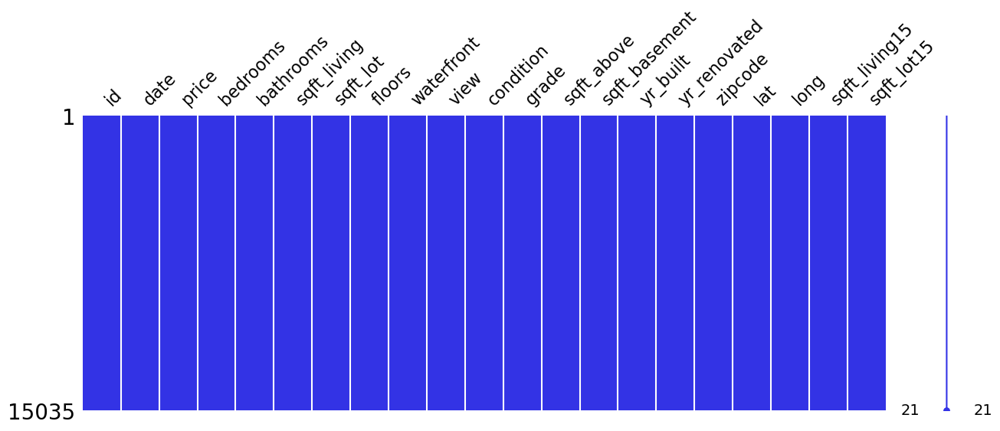

In [9]:
# 결측값
msno.matrix(df=eda_df.iloc[:, :], color=(0.2, 0.2, 0.9), figsize=(15, 5))

In [10]:
train_unique = []
data_col = ['price', 'bedrooms', 'bathrooms', 'sqft_living','sqft_lot', 
            'floors', 'waterfront', 'view', 'condition', 'grade',
            'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 
            'zipcode','lat', 'long', 'sqft_living15', 'sqft_lot15']

for i in data_col:
    train_unique.append(len(eda_df[i].unique()))
unique_train = pd.DataFrame()
unique_train['columns'] = data_col
unique_train['unique_value'] = train_unique

In [11]:
upper_100_data = unique_train[(unique_train['unique_value'] > 10) & (unique_train['unique_value'] < 30)].sort_values(by='unique_value', ascending=False)
lower_10_data = unique_train[(unique_train['unique_value'] < 10)].sort_values(by='unique_value', ascending=False)
upper_1000_data = unique_train[(unique_train['unique_value'] > 1000)].sort_values(by='unique_value', ascending=False)

In [12]:
fig = make_subplots(
    rows=1, cols=3,
    start_cell='bottom-left',
    subplot_titles=['Unique Value(over 1000)', 'Unique Value(over 100)', 'Unique Value(under 10)']
)

fig.add_trace(go.Bar(x=upper_1000_data['columns'], y=upper_1000_data['unique_value']), row=1, col=1)
fig.add_trace(go.Bar(x=upper_100_data['columns'], y=upper_100_data['unique_value']), row=1, col=2)
fig.add_trace(go.Bar(x=lower_10_data['columns'], y=lower_10_data['unique_value']), row=1, col=3)
fig.show()

- 결측값 확인 결과 없는 것으로 판단하고 그대로 EDA를 진행할 것입니다. 종속변수인 집값의 분포부터 먼저 살펴보겠습니다.
- unique 값을 확인한 결과 View, conditions 는 5점 척도를 사용한것으로 보입니다.

## 1-1. Price Column(종속변수)

In [13]:
eda_df.price.describe()

count     15035.00
mean     540682.65
std      371524.66
min       78000.00
25%      322000.00
50%      450000.00
75%      645000.00
max     7700000.00
Name: price, dtype: float64

In [14]:
data = eda_df.price
fig = px.histogram(data, x='price')
fig.show()

- 집값의 편차가 매우 크고 히스토그램을 살펴본 결과 왼쪽으로 매우 치우쳐 있습니다. (skewed data)
- 회귀문제의 경우 데이터가 정규분포에 따르지 않게 되면 train시 문제가 발생할 수 있어 정규성을 띄도록 전처리를 진행해야 합니다.

#### price scaling
- log를 통해 데이터의 분포를 정규분포화하겠습니다.
- 참고 :https://hong-yp-ml-records.tistory.com/28

In [15]:
eda_df['price'] = np.log1p(eda_df['price'])
#histogram
data = eda_df.price
fig = px.histogram(data, x='price')
fig.update_layout(go.Layout(title = {'text': 'Log Price Histogram ',
                                     'font':{'size':30}}))
fig.show()

## 1-2. Correlation
- 해당 데이터는 종속변수의 누락값이 없어 상관관계 분석을 진행합니다.
- 히트맵을 그려 상관관계를 표현합니다.
- 상관계수를 높은 feature들 위주로 EDA를 진행하겠습니다.

In [16]:
eda_df.columns

Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'sqft_living15', 'sqft_lot15'],
      dtype='object')

In [17]:
heatmap_data = eda_df[
    ['price', 'bedrooms', 'bathrooms', 'sqft_living',
    'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
    'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode',
    'lat', 'long', 'sqft_living15', 'sqft_lot15']
    ]
cor = heatmap_data.astype(float).corr().nlargest(n=10, columns='price')
fig = px.imshow(cor, text_auto=True, aspect="auto")
fig.update_layout(go.Layout(title = {'text': 'Correlation', 'font':{'size':30}}))
fig.show()

- grade가 가장 높은 상관관계를 나타냈습니다!
- 그다음으로 sqft_living -> sqft_living15 -> sqft_above순 입니다.
- 미국은 집을 구입할때 위도도 신경쓰나봅니다. 신기하게도 lat도 상관관계에 포함이 되었네요.
- 생각보다 방의 개수가 종속변수에 강한 상관관계를 가지지 않고 있습니다. 미국인은 방의 개수를 그리 중요하게 생각하지 않는 것일까요?
- 그럼 다음로 grade 순으로 데이터를 살펴 보겠습니다.
  - grade 는 총 1~13 까지 부여가 되어 있습니다. 
  - 13부터 제일 좋은 등급이라고 보면 되겠습니다.

## 1-3. Price & Grade

#### Grade

- 출처: https://www.kaggle.com/competitions/2019-2nd-ml-month-with-kakr/discussion/84029

- Represents the construction quality of improvements. Grades run from grade 1 to 13.

Generally defined as:

1-3 Falls short of minimum building standards. Normally cabin or inferior structure.

4 Generally older, low quality construction. Does not meet code.

5 Low construction costs and workmanship. Small, simple design.

6 Lowest grade currently meeting building code. Low quality materials and simple designs.

7 Average grade of construction and design. Commonly seen in plats and older sub-divisions.

8 Just above average in construction and design. Usually better materials in both the exterior and interior finish work.

9 Better architectural design with extra interior and exterior design and quality.

10 Homes of this quality generally have high quality features. Finish work is better and more design quality is seen in the floor plans. Generally have a larger square footage.

11 Custom design and higher quality finish work with added amenities of solid woods, bathroom fixtures and more luxurious options.

12 Custom design and excellent builders. All materials are of the highest quality and all conveniences are present.

13 Generally custom designed and built. Mansion level. Large amount of highest quality cabinet work, wood trim, marble, entry ways etc.

In [18]:
data = eda_df.grade
fig = px.histogram(eda_df, x='grade')
fig.update_layout(go.Layout(title = {'text': 'Grade Histogram','font':{'size': 30}}))
fig.show()

- Grade를 잘 살펴보니 7 ~ 8 등급이 제일 많습니다.
- 그 다음으로 이상치를 보기 위해 price와 grade의 boxplot을 보겠습니다.

In [19]:
fig = px.box(eda_df, x='grade', y='price')
fig.update_layout(go.Layout(title = {'text': 'Grade-Price Boxplot',
    'font':{'size': 30}}))
fig.show()

- 전체적으로 grade가 높아 질수록 집값이 증가하는 성향이 보입니다.
- 특이하게도 grade에서 3인 경우의 집값이 꽤 높게 나왔습니다. -> 이 부분도 중점적으로 확인해봐야할 사항입니다.
- grade 7,8,9 에서 많은 이상치가 발생했습니다. 면밀히 보고 제거해야할 사항 일지 판단해야겠습니다.

## 1-4. Sqft_living + Sqft_living15
- 참고: https://www.kaggle.com/competitions/2019-2nd-ml-month-with-kakr/discussion/87468

  - sqft_living: 거주하는 건물 면적
  - sqft_lot: 대지 면적. living size _ front yard, back yard (total land space)
  - sqft_above: 지상층 면적
  - sqft_basement: 지하층의 면적

In [20]:
fig = px.histogram(eda_df, x='sqft_living')
fig.show()

In [21]:
data = eda_df.sqft_living
fig = px.box(eda_df, x='sqft_living')
fig.update_layout(go.Layout(title = {'text': 'Sqft_living Boxplot',
    'font':{'size': 30}}))
fig.show()

In [22]:
fig = px.scatter(eda_df, x='sqft_living', y='price')
fig.show()

In [23]:
fig = px.histogram(eda_df, x='sqft_living15')
fig.show()

In [24]:
data = eda_df.sqft_living15
fig = px.box(eda_df, x='sqft_living15')
fig.update_layout(go.Layout(title = {'text': 'Sqft_living15 Boxplot',
    'font':{'size': 30}}))
fig.show()

In [25]:
fig = px.scatter(eda_df, x='sqft_living15', y='price')
fig.show()

### result

- sqrt_living 와 sqrt_living15에서 boxplot을 확인한 결과 이상치 값이 많이 보입니다.

## 1-5. Bathrooms

In [26]:
fig = px.scatter(eda_df, x='bathrooms', y='price')
fig.show()

In [27]:
data = eda_df.bathrooms
fig = px.box(eda_df, x='bathrooms')
fig.update_layout(go.Layout(title = {'text': 'bathrooms Boxplot',
    'font':{'size': 30}}))
fig.show()

In [28]:
fig = px.box(eda_df, x='bathrooms', y='price')
fig.update_layout(go.Layout(title = {'text': 'bathrooms-Price Boxplot',
    'font':{'size': 30}}))
fig.show()

## 1-6. Bedrooms

In [29]:
fig = px.histogram(eda_df, x='bedrooms')
fig.show()

In [30]:
fig = px.box(eda_df, x='bedrooms', y='price')
fig.update_layout(go.Layout(title = {'text': 'bedrooms-Price Boxplot',
    'font':{'size': 30}}))
fig.show()

## 1-7. Conclusion
- 중요 변수 : sqrt_living, grade, bedrooms
- 위 변수를 토대로 데이터 전처리 진행

---

## 2. Data Preprocessing

In [31]:
fe_df = eda_df.copy()

In [32]:
# Date에서 T 이후 문자열은 삭제
fe_df['date']= fe_df.date.str.split('T').str[0]

# 2-1. Grade

In [33]:
fe_df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,0,20141013,12.31,3,1.00,1180,5650,1.00,0,0,3,7,1180,0,1955,0,98178,47.51,-122.26,1340,5650
1,1,20150225,12.10,2,1.00,770,10000,1.00,0,0,3,6,770,0,1933,0,98028,47.74,-122.23,2720,8062
2,2,20150218,13.14,3,2.00,1680,8080,1.00,0,0,3,8,1680,0,1987,0,98074,47.62,-122.05,1800,7503
3,3,20140627,12.46,3,2.25,1715,6819,2.00,0,0,3,7,1715,0,1995,0,98003,47.31,-122.33,2238,6819
4,4,20150115,12.58,3,1.50,1060,9711,1.00,0,0,3,7,1060,0,1963,0,98198,47.41,-122.31,1650,9711


In [34]:
fig = px.box(fe_df, x='grade')
fig.update_layout(go.Layout(title = {'text': 'grade  Boxplot',
    'font':{'size': 30}}))
fig.show()

In [35]:
fig = px.box(eda_df, x='grade', y='price')
fig.update_layout(go.Layout(title = {'text': 'Grade-Price Boxplot',
    'font':{'size': 30}}))
fig.show()

In [36]:
fe_df.loc[(fe_df['price'] > 12) & (fe_df['grade'] == 3)]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
2302,2302,20150225,12.48,1,0.75,520,12981,1.00,0,0,5,3,520,0,1920,0,98022,47.21,-122.00,1340,12233
4123,4123,20141104,12.54,1,0.00,600,24501,1.00,0,0,2,3,600,0,1950,0,98045,47.53,-121.75,990,22549


In [37]:
fe_df.loc[(fe_df['price'] > 14.7) & (fe_df['grade'] == 8)]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
7173,7173,20140813,14.81,5,4.00,4230,27295,2.00,1,4,3,8,3230,1000,1949,1985,98033,47.68,-122.21,2660,27295


In [38]:
fe_df.loc[(fe_df['price'] > 15.7) & (fe_df['grade'] == 11)]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
2775,2775,20140611,15.77,5,4.50,10040,37325,2.00,1,2,3,11,7680,2360,1940,2001,98004,47.65,-122.21,3930,25449


In [39]:
fe_df.loc[(fe_df['price'] > 14.5) & (fe_df['grade'] == 7)]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
12346,12346,20150115,14.53,4,3.25,3580,19989,1.50,1,4,4,7,3480,100,1915,1965,98125,47.71,-122.28,2410,6389


In [40]:
fe_df.loc[(fe_df['price'] < 11.6) & (fe_df['grade'] == 7)]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
878,878,20140717,11.51,2,1.00,770,17334,1.00,0,0,3,7,770,0,1978,0,98001,47.30,-122.27,1480,17334
2372,2372,20141212,11.46,2,1.00,800,8550,1.00,0,0,3,7,800,0,1947,0,98198,47.41,-122.29,1490,8550
8756,8756,20140513,11.41,2,1.00,790,2640,1.00,0,0,3,7,790,0,1973,0,98034,47.74,-122.18,1310,2064


In [41]:
fe_df.loc[(fe_df['price'] < 12.8) & (fe_df['grade'] == 10)]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
10581,10581,20150223,12.66,1,2.00,1780,188465,2.00,0,0,3,10,1780,0,2001,0,98045,47.45,-121.77,1780,21094


In [42]:
fe_df = fe_df[fe_df['id'] != 2302]
fe_df = fe_df[fe_df['id'] != 4123]
fe_df = fe_df[fe_df['id'] != 7173]
fe_df = fe_df[fe_df['id'] != 2775]
fe_df = fe_df[fe_df['id'] != 2372]
fe_df = fe_df[fe_df['id'] != 8756]
fe_df = fe_df[fe_df['id'] != 10581]

## 2-2. sqft_living

In [43]:
data = eda_df.sqft_living
fig = px.box(eda_df, x='sqft_living')
fig.update_layout(go.Layout(title = {'text': 'Sqft_living Boxplot',
    'font':{'size': 30}}))
fig.show()

In [44]:
fe_df[fe_df['sqft_living'] > 12000]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
5108,5108,20141013,15.86,6,8.00,12050,27600,2.50,0,3,4,13,8570,3480,1910,1987,98102,47.63,-122.32,3940,8800
8912,8912,20140505,14.64,7,8.00,13540,307752,3.00,0,4,3,12,9410,4130,1999,0,98053,47.67,-121.99,4850,217800


In [45]:
fe_df = fe_df[fe_df['id'] != 5108]
fe_df = fe_df[fe_df['id'] != 8912]

In [46]:
data = eda_df.sqft_living15
fig = px.box(eda_df, x='sqft_living15')
fig.update_layout(go.Layout(title = {'text': 'Sqft_living Boxplot15',
    'font':{'size': 30}}))
fig.show()

In [47]:
idx = fe_df[fe_df['sqft_living15'] > 5500].index

In [48]:
fe_df.drop(index=idx, inplace=True)

## 2-3. Bedrooms

In [49]:
fig = px.box(eda_df, x='bedrooms', y='price')
fig.update_layout(go.Layout(title = {'text': 'bedrooms-Price Boxplot',
    'font':{'size': 30}}))
fig.show()

In [50]:
fe_df.loc[(fe_df['price'] <= 11.40758) & (fe_df['bedrooms'] == 1)]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
339,339,20140523,11.29,1,0.75,430,5050,1.00,0,0,2,4,430,0,1912,0,98014,47.65,-121.91,1200,7500
2219,2219,20150219,11.41,1,1.00,570,4080,1.00,0,0,3,5,570,0,1942,0,98146,47.51,-122.33,890,5100
5623,5623,20150303,11.41,1,1.00,780,4000,1.00,0,0,3,5,780,0,1905,0,98108,47.54,-122.32,1150,4000
11523,11523,20150418,11.41,1,1.00,560,4120,1.00,0,0,3,4,560,0,1947,0,98106,47.53,-122.35,980,4120


In [51]:
idx = fe_df.loc[(fe_df['price'] <= 11.40758) & (fe_df['bedrooms'] == 1)].index
fe_df.drop(index=idx, inplace=True)

In [52]:
fe_df.loc[(fe_df['price'] < 11.6) & (fe_df['bedrooms'] == 4)]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
3992,3992,20140610,11.51,4,1.00,1120,2685,1.00,0,0,3,5,860,260,1939,0,98055,47.49,-122.20,1120,4838


In [53]:
fe_df = fe_df[fe_df['id'] != 3992]

In [54]:
fe_df.loc[(fe_df['price'] < 11.8) & (fe_df['bedrooms'] == 5)]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
11032,11032,20141220,11.80,5,2.00,1430,5600,1.50,0,0,3,6,1430,0,1947,0,98118,47.52,-122.27,1860,5980


In [55]:
fe_df = fe_df[fe_df['id'] != 11032]

In [56]:
fe_df.loc[(fe_df['price'] > 14.8) & (fe_df['bedrooms'] == 7)]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
9772,9772,20140926,14.88,7,3.00,5350,14400,2.50,0,0,4,10,5020,330,1910,0,98112,47.63,-122.28,3050,7469


In [57]:
fe_df = fe_df[fe_df['id'] != 9772]

In [58]:
fe_df.loc[(fe_df['price'] > 14.9) & (fe_df['bedrooms'] == 6)]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
947,947,20150413,15.48,6,6.00,7390,24829,2.00,1,4,4,12,5000,2390,1991,0,98040,47.56,-122.21,4320,24619
4598,4598,20150421,15.11,6,4.75,5480,19401,1.50,1,4,5,11,3910,1570,1936,0,98105,47.65,-122.28,3510,15810
5560,5560,20140923,14.98,6,5.00,7100,18200,2.50,0,0,3,13,5240,1860,1933,2002,98199,47.64,-122.41,3130,6477
6469,6469,20140919,15.74,6,7.75,9890,31374,2.00,0,4,3,13,8860,1030,2001,0,98039,47.63,-122.24,4540,42730
8977,8977,20140529,14.95,6,4.25,6980,15682,3.00,0,4,4,12,5330,1650,1999,0,98040,47.56,-122.23,3930,18367


In [59]:
idx = fe_df.loc[(fe_df['price'] > 14.9) & (fe_df['bedrooms'] == 6)].index
fe_df.drop(index=idx, inplace=True)

In [60]:
display(fe_df.loc[(fe_df['price'] > 14.6) & (fe_df['bedrooms'] == 6)])
display(fe_df.loc[(fe_df['price'] > 14.6) & (fe_df['bedrooms'] == 7)])
display(fe_df.loc[(fe_df['price'] > 14.4) & (fe_df['bedrooms'] == 7)])
display(fe_df.loc[(fe_df['price'] < 11.7) & (fe_df['bedrooms'] == 1)])

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
12801,12801,20141208,14.78,6,4.75,5540,7200,2.50,0,2,4,11,3950,1590,1909,0,98119,47.64,-122.37,2930,7200
14140,14140,20150225,14.67,6,4.25,5550,11547,2.00,0,2,3,11,4270,1280,2014,0,98033,47.65,-122.20,3480,11547


,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
10476,10476,20140930,14.71,7,4.25,4670,23115,2.00,0,2,3,11,4670,0,1992,0,98039,47.62,-122.23,3240,13912


,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
411,411,20140620,14.48,7,3.50,4640,15235,2.00,0,1,3,11,2860,1780,1965,2003,98040,47.57,-122.23,3230,20697
10476,10476,20140930,14.71,7,4.25,4670,23115,2.00,0,2,3,11,4670,0,1992,0,98039,47.62,-122.23,3240,13912


,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
5679,5679,20141021,11.68,1,1.00,670,7957,1.00,0,0,4,6,670,0,1978,0,98038,47.36,-122.06,1600,7957
7093,7093,20140725,11.63,1,1.00,1080,3230,1.00,0,0,3,6,1080,0,1963,0,98002,47.31,-122.22,1210,5760
7956,7956,20141126,11.57,1,1.00,560,5700,1.00,0,0,3,5,560,0,1947,0,98146,47.51,-122.36,1120,5000


In [61]:
fe_df = fe_df[fe_df['id'] != 12801]
fe_df = fe_df[fe_df['id'] != 10476]
fe_df = fe_df[fe_df['id'] != 411]
fe_df = fe_df[fe_df['id'] != 7956]
fe_df = fe_df[fe_df['id'] != 7093]


In [62]:
fig = px.box(fe_df, x='bedrooms', y='price')
fig.update_layout(go.Layout(title = {'text': 'Remove outlier bedrooms-Price Boxplot',
    'font':{'size': 30}}))
fig.show()

- 모든 outlier제거

In [63]:
# def remove_outlier(data, column):
#     column_data = data[column]
#     quan_25 = np.percentile(column_data, 25)
#     quan_75 = np.percentile(column_data, 75)
    
#     iqr = quan_75 - quan_25
#     iqr = iqr * 1.5
#     lowest = quan_25 - iqr
#     upper = quan_75 + iqr
#     outlier_idx = column_data[(column_data < lowest) | (column_data > upper)].index
#     data.drop(outlier_idx, axis=0, inplace=True)
#     return data

In [64]:
# remove_outlier(fe_df, 'bedrooms')

In [65]:
# remove_outlier(fe_df, 'sqft_living15')

## 2-4. 정규화
- 참고: https://www.kaggle.com/code/kcs93023/2019-ml-month-2nd-baseline/notebook

In [66]:
skew_columns = ['bedrooms', 'sqft_living', 'sqft_lot', 'sqft_above', 'sqft_basement']

for c in skew_columns:
    fe_df[c] = np.log1p(fe_df[c].values)

## 2-5. 변수 추가
- renovated : yr_renovated - yr_built
- per_price : price / sqft_living

In [67]:
fe_df['renovated'] = fe_df['yr_renovated'] - fe_df['yr_built']
fe_df['renovated'] = fe_df['renovated'].apply(lambda x: 0 if x==0 else 1)
fe_df['date'] = fe_df['date'].astype('int')

fe_df['per_price'] = fe_df['price'] / fe_df['sqft_living']

---

# 3. Modeling

In [68]:
train = fe_df.copy()

In [69]:
test_df['date']= test_df.date.str.split('T').str[0]
test_df['date']= test_df['date'].astype(int)

In [70]:
y_reg = train['price']

In [71]:
train_columns = [c for c in train.columns if c not in ['id', 'price', 'per_price', 'renovated']]

In [72]:
train = train[train_columns]

In [73]:
from sklearn.model_selection import KFold, cross_val_score
from sklearn.model_selection import cross_val_predict
from sklearn.preprocessing import RobustScaler
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

In [74]:
fold = KFold(n_splits=5, shuffle=True, random_state=42)
oof = np.zeros(len(train))
predictions = np.zeros(len(test_df))
feature_importance_df = pd.DataFrame()

## 3-1. LightGBM
- 참고: https://www.kaggle.com/code/chocozzz/house-price-prediction-eda-updated-2019-03-12

In [75]:
import time
start = time.time()
import lightgbm as lgb
from sklearn.metrics import mean_squared_error

LGB = lgb.LGBMClassifier()
param = {
    'num_leaves': 31,
    'min_data_in_leaf': 30, 
    'objective':'regression',
    'max_depth': -1,
    'learning_rate': 0.015,
    "min_child_samples": 20,
    "boosting": "gbdt",
    "feature_fraction": 0.9,
    "bagging_freq": 1,
    "bagging_fraction": 0.9,
    "bagging_seed": 11,
    "metric": 'rmse',
    "lambda_l1": 0.1,
    "verbosity": -1,
    "nthread": 4,
    "random_state": 4950
}

#run model
for fold_, (trn_idx, val_idx) in enumerate(fold.split(train)):
    trn_data = lgb.Dataset(train.iloc[trn_idx][train_columns], label=y_reg.iloc[trn_idx])
    val_data = lgb.Dataset(train.iloc[val_idx][train_columns], label=y_reg.iloc[val_idx])

    num_round = 10000
    clf = lgb.train(param, trn_data, num_round, valid_sets = [trn_data, val_data], verbose_eval=500, early_stopping_rounds = 100)
    oof[val_idx] = clf.predict(train.iloc[val_idx][train_columns], num_iteration=clf.best_iteration)
    
    #feature importance
    fold_importance_df = pd.DataFrame()
    fold_importance_df["Feature"] = train_columns
    fold_importance_df["importance"] = clf.feature_importance()
    fold_importance_df["fold"] = fold_ + 1
    feature_importance_df = pd.concat([feature_importance_df, fold_importance_df], axis=0)
    #predictions
    predictions += clf.predict(test_df[train_columns], num_iteration=clf.best_iteration) / fold.n_splits
    
cv = np.sqrt(mean_squared_error(oof, y_reg))
print(cv)

[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
Training until validation scores don't improve for 100 rounds
[500]	training's rmse: 0.140137	valid_1's rmse: 0.158721
[1000]	training's rmse: 0.122982	valid_1's rmse: 0.15505
[1500]	training's rmse: 0.111348	valid_1's rmse: 0.153766
[2000]	training's rmse: 0.102091	valid_1's rmse: 0.153453
Early stopping, best iteration is:
[2053]	training's rmse: 0.101212	valid_1's rmse: 0.153418
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
Training until validation scores don't improve for 100 rounds
[500]	training's rmse: 0.138638	valid_1's rmse: 0.165829
[1000]	training's rmse: 0.121255	valid_1's rmse: 0.162469
[1500]	training's rmse: 0.109529	valid_1's rmse: 0.161576
[2000]	training's rmse: 0.100186	valid_1's rmse: 0.161221
Early stopping, best iteration is:
[2348]	training's rmse: 0.0945653	valid_1's

In [76]:
cv1 = np.sqrt(mean_squared_error(np.expm1(oof), np.expm1(y_reg)))
print(cv1)

107775.44067126892


In [77]:
cols = (feature_importance_df[["Feature", "importance"]]
        .groupby("Feature")
        .mean()
        .sort_values(by="importance", ascending=False)[:1000].index)
best_features = feature_importance_df.loc[feature_importance_df.Feature.isin(cols)].sort_values(by="importance",ascending=False)

fig = px.bar(x=best_features['importance'], y=best_features['Feature'])
fig.show()

In [78]:
df_pred = pd.DataFrame(oof)
df_y_reg = pd.DataFrame(y_reg)

In [79]:
data = pd.concat([df_pred, df_y_reg], axis=1)
data.columns = ['train_y','y_reg']

fig = px.scatter(x=data['train_y'], y=data['y_reg'])
fig.update_layout(go.Layout(xaxis={'title': {'text': 'prediction'}, 
                                   'gridwidth':1, 'showgrid':False},
                            yaxis={'title': {'text': 'y_reg'}, 
                                   'gridwidth':1}))
fig.show()

In [80]:
data['error'] = data['y_reg'] - data['train_y']
fig = px.scatter(x=data['y_reg'], y=data['error'])
fig.update_layout(go.Layout(xaxis={'title': {'text': 'prediction'}, 
                                   'gridwidth':1, 'showgrid':False},
                            yaxis={'title': {'text': 'error'}, 
                                   'gridwidth':1}))
fig.show()

- 예측 결과 집값이 12이하 이거나 15이상일 경우 에러가 큰 경향이 나타납니다.
- 13 ~ 14일 경우 예측값이 잘 맞습니다. 에러가 0에 가까갑습니다.
- 오차가 .5 이상인 경우가 있습니다.
- 집값이 15 이상인 경우에는 더 크게 예측을 하며 집값이 12이하인 경우에는 더 작게 예측하는 경향이 있습니다.

In [81]:
oof.shape

(15000,)

In [82]:
train_df.shape

(15035, 21)

In [83]:
lgb1_oof = pd.DataFrame()
lgb1_oof['id'] = fe_df.id
lgb1_oof['price'] = oof

lgb1_sub = pd.DataFrame()
lgb1_sub['id'] = test_df.id
lgb1_sub['price'] = predictions
cv1 = np.sqrt(mean_squared_error(np.expm1(oof), np.expm1(y_reg)))
print(cv1)

107775.44067126892


In [84]:
import lightgbm as lgb
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import KFold, cross_val_score
from sklearn.model_selection import cross_val_predict
from sklearn.preprocessing import RobustScaler
from sklearn.pipeline import make_pipeline

from sklearn.linear_model import RidgeCV

param = {'num_leaves': 31,
         'min_data_in_leaf': 30, 
         'objective':'regression',
         'max_depth': -1,
         'learning_rate': 0.005,
         "min_child_samples": 20,
         "boosting": "gbdt",
         "feature_fraction": 0.9,
         "bagging_freq": 1,
         "bagging_fraction": 0.9 ,
         "bagging_seed": 11,
         "metric": 'rmse',
         "lambda_l1": 0.1,
         "verbosity": -1,
         "nthread": 4,
         "random_state": 4950}

y_reg = np.expm1(fe_df['price'])

#prepare fit model with cross-validation
folds = KFold(n_splits=5, shuffle=True, random_state=42)
oof = np.zeros(len(train))
predictions = np.zeros(len(test_df))
feature_importance_df = pd.DataFrame()

#run model
for fold_, (trn_idx, val_idx) in enumerate(folds.split(train)):
    trn_data = lgb.Dataset(train.iloc[trn_idx][train_columns], label=y_reg.iloc[trn_idx])
    val_data = lgb.Dataset(train.iloc[val_idx][train_columns], label=y_reg.iloc[val_idx])

    num_round = 10000
    clf = lgb.train(param, trn_data, num_round, valid_sets = [trn_data, val_data], verbose_eval=500, early_stopping_rounds = 100)
    oof[val_idx] = clf.predict(train.iloc[val_idx][train_columns], num_iteration=clf.best_iteration)
    #feature importance
    fold_importance_df = pd.DataFrame()
    fold_importance_df["Feature"] = train_columns
    fold_importance_df["importance"] = clf.feature_importance()
    fold_importance_df["fold"] = fold_ + 1
    feature_importance_df = pd.concat([feature_importance_df, fold_importance_df], axis=0)
    
    #predictions
    predictions += clf.predict(test_df[train_columns], num_iteration=clf.best_iteration) / folds.n_splits
    
cv = np.sqrt(mean_squared_error(oof, y_reg))
mse = mean_squared_error(oof, y_reg)
mae = mean_absolute_error(oof, y_reg)
print(f'rmse: {cv}, mse: {mse}, mae : {mae}')

[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
Training until validation scores don't improve for 100 rounds
[500]	training's rmse: 121856	valid_1's rmse: 126378
[1000]	training's rmse: 98036.1	valid_1's rmse: 113423
[1500]	training's rmse: 89291.1	valid_1's rmse: 110981
[2000]	training's rmse: 83239.6	valid_1's rmse: 110033
[2500]	training's rmse: 78391.5	valid_1's rmse: 109594
Early stopping, best iteration is:
[2594]	training's rmse: 77570.9	valid_1's rmse: 109501
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
Training until validation scores don't improve for 100 rounds
[500]	training's rmse: 117173	valid_1's rmse: 152502
[1000]	training's rmse: 93093.3	valid_1's rmse: 134391
[1500]	training's rmse: 83992.9	valid_1's rmse: 130200
[2000]	training's rmse: 77841.6	valid_1's rmse: 128141
[2500]	training's rmse: 73122	valid_1's rmse: 12679

In [85]:
lgb2_oof = pd.DataFrame()
lgb2_oof['id'] = fe_df.id
lgb2_oof['price'] = oof

lgb2_sub = pd.DataFrame()
lgb2_sub['id'] = test_df.id
lgb2_sub['price'] = predictions

cv2 = np.sqrt(mean_squared_error(oof, y_reg))
print(cv2)

112852.15376146718


## 3-2. Xgboost

In [86]:
import xgboost as xgb
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn.model_selection import StratifiedKFold

x, y = fe_df.drop(['id', 'price', 'per_price', 'renovated'], axis=1), np.log1p(y_reg)


X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

grid_params = {
        'n_estimators': [ 500, 1000 ],
        "learning_rate"    : [ 0.02, 0.05, 0.5] ,
        "max_depth"        : range(3, 10, 3),
        "min_child_weight" : range(1, 6, 2),
        "gamma"            : [ 0.05 ],
        'subsample' : [ 0.5, 0.6, 0.7, 0.9 ],
}


clf = xgb.XGBRegressor()

random_search = RandomizedSearchCV(clf, param_distributions=grid_params, scoring='neg_mean_squared_error', n_jobs=4, cv=3, verbose=10)

random_search.fit(X_train, y_train)

Fitting 3 folds for each of 10 candidates, totalling 30 fits
[CV 3/3; 1/10] START gamma=0.05, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=1000, subsample=0.6
[CV 2/3; 1/10] START gamma=0.05, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=1000, subsample=0.6
[CV 1/3; 1/10] START gamma=0.05, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=1000, subsample=0.6
[CV 1/3; 2/10] START gamma=0.05, learning_rate=0.05, max_depth=9, min_child_weight=3, n_estimators=500, subsample=0.6
[CV 2/3; 1/10] END gamma=0.05, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=1000, subsample=0.6;, score=-0.028 total time=   4.4s
[CV 1/3; 1/10] END gamma=0.05, learning_rate=0.05, max_depth=3, min_child_weight=5, n_estimators=1000, subsample=0.6;, score=-0.027 total time=   4.4s
[CV 2/3; 2/10] START gamma=0.05, learning_rate=0.05, max_depth=9, min_child_weight=3, n_estimators=500, subsample=0.6
[CV 3/3; 1/10] END gamma=0.05, learning_rate

RandomizedSearchCV(cv=3,
                   estimator=XGBRegressor(base_score=None, booster=None,
                                          callbacks=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None,
                                          early_stopping_rounds=None,
                                          enable_categorical=False,
                                          eval_metric=None, feature_types=None,
                                          gamma=None, gpu_id=None,
                                          grow_policy=None,
                                          importance_type=None,
                                          interaction_constraints=None,
                                          learning_rate=...
                                          monotone_constraints=None,
                                          n_estimators=100, n_jobs=None,
                                          num_parallel_tree=None,
                                          predictor=None, random_state=None, ...),
                   n_jobs=4,
                   param_distributions={'gamma': [0.05],
                                        'learning_rate': [0.02, 0.05, 0.5],
                                        'max_depth': range(3, 10, 3),
                                        'min_child_weight': range(1, 6, 2),
                                        'n_estimators': [500, 1000],
                                        'subsample': [0.5, 0.6, 0.7, 0.9]},
                   scoring='neg_mean_squared_error', verbose=10)

In [87]:
print('Best Parameter: {}'.format(random_search.best_params_))

Best Parameter: {'subsample': 0.5, 'n_estimators': 1000, 'min_child_weight': 3, 'max_depth': 9, 'learning_rate': 0.02, 'gamma': 0.05}


In [88]:
# code : https://www.kaggle.com/karell/kakr-2nd-house-price-xgb-starter-109145
import xgboost as xgb

xgb_params = {
    'learning_rate': 0.01,
    'max_depth': 6,
    'subsample': 0.6,
    'colsample_bytree': 0.8,
    'objective': 'reg:squarederror',
    'eval_metric': 'rmse',
    'gamma':0.05
}
log_y_reg = np.log1p(y_reg)
print('Transform DMatrix...')
dtrain = xgb.DMatrix(train[train_columns], log_y_reg)
dtest = xgb.DMatrix(test_df[train_columns])

print('Start Cross Validation...')

cv_output = xgb.cv(xgb_params, dtrain, num_boost_round=5000, early_stopping_rounds=50, verbose_eval=500, show_stdv=False)
print('best num_boost_rounds = ', len(cv_output))
rounds = len(cv_output)

model = xgb.train(xgb_params, dtrain, num_boost_round = rounds)
preds = model.predict(dtest)

xgb1_sub = test_df[['id']]
xgb1_sub['price'] = preds

Transform DMatrix...
Start Cross Validation...
[0]	train-rmse:12.43213	test-rmse:12.43213
[500]	train-rmse:0.18119	test-rmse:0.19561
[1000]	train-rmse:0.13360	test-rmse:0.16311
[1500]	train-rmse:0.11902	test-rmse:0.15970
[2000]	train-rmse:0.10881	test-rmse:0.15823
[2500]	train-rmse:0.10115	test-rmse:0.15766
[3000]	train-rmse:0.09554	test-rmse:0.15743
[3207]	train-rmse:0.09352	test-rmse:0.15738
best num_boost_rounds =  3158


In [89]:
import xgboost as xgb

xgb_params = {
    'learning_rate': 0.01,
    'max_depth': 6,
    'subsample': 0.8,
    'colsample_bytree': 0.8,
    'objective': 'reg:squarederror',
    'eval_metric': 'rmse',
    'gamma':0.05
}

print('Transform DMatrix...')
dtrain = xgb.DMatrix(train[train_columns], y_reg)
dtest = xgb.DMatrix(test_df[train_columns])

print('Start Cross Validation...')

cv_output = xgb.cv(xgb_params, dtrain, num_boost_round=20000, early_stopping_rounds=100, verbose_eval=200, show_stdv=False)
print('best num_boost_rounds = ', len(cv_output))
rounds = len(cv_output)

model = xgb.train(xgb_params, dtrain, num_boost_round = rounds)
preds = model.predict(dtest)

xgb2_sub = test_df[['id']]
xgb2_sub['price'] = preds

Transform DMatrix...
Start Cross Validation...
[0]	train-rmse:635984.66529	test-rmse:635941.65413
[200]	train-rmse:143434.95129	test-rmse:163084.45596
[400]	train-rmse:87946.36671	test-rmse:122319.75516
[600]	train-rmse:77935.49375	test-rmse:117147.90083
[800]	train-rmse:71535.10075	test-rmse:114807.01516
[1000]	train-rmse:66602.04766	test-rmse:113534.59190
[1200]	train-rmse:62401.02121	test-rmse:112635.01043
[1400]	train-rmse:58853.74196	test-rmse:112042.82792
[1600]	train-rmse:55789.02636	test-rmse:111567.19181
[1800]	train-rmse:53104.14115	test-rmse:111210.70741
[2000]	train-rmse:50624.83839	test-rmse:110948.25215
[2200]	train-rmse:48391.08758	test-rmse:110740.04340
[2400]	train-rmse:46343.11720	test-rmse:110580.82926
[2600]	train-rmse:44462.12827	test-rmse:110453.74512
[2800]	train-rmse:42712.99766	test-rmse:110351.06556
[3000]	train-rmse:41083.35081	test-rmse:110262.31041
[3200]	train-rmse:39488.30397	test-rmse:110151.97624
[3400]	train-rmse:38031.26951	test-rmse:110088.72759
[360

In [90]:
lgb_oof = pd.merge(lgb1_oof, lgb2_oof, how='left', on='id')
lgb_train = fe_df[['id','price']]
lgb_oof = pd.merge(lgb_oof,lgb_train,how='left',on='id')
lgb_oof.columns = ['id','price1','price2','price']

lgb_ensemble = (0.9*np.expm1(lgb_oof['price1']) + 0.1*lgb_oof['price2']).values
cv = np.sqrt(mean_squared_error(lgb_ensemble, np.expm1(lgb_oof['price']).values))
print(cv)

107397.86386062852


In [91]:
lgb_sub = pd.merge(lgb1_sub,lgb2_sub,how='left',on='id')
lgb_sub.columns = ['id','price1','price2']
lgb_sub['price'] = (0.9*np.expm1(lgb_sub['price1']) + 0.1*lgb_sub['price2'])
lgb_sub = lgb_sub[['id','price']]

In [92]:
xgb_sub = pd.merge(xgb1_sub,xgb2_sub,how='left',on='id')
xgb_sub.columns = ['id','price1','price2']
xgb_sub['price'] = (0.9*np.expm1(xgb_sub['price1']) + 0.1*xgb_sub['price2'])
xgb_sub = xgb_sub[['id','price']]

In [93]:
ensemble_sub = pd.merge(lgb_sub, xgb_sub,how='left',on='id')
ensemble_sub.columns = ['id','price1','price2']
ensemble_sub['price'] = 0.9*ensemble_sub['price1'] + 0.1*ensemble_sub['price2']
ensemble_sub = ensemble_sub[['id','price']]

ensemble_sub.to_csv("submission6.csv",index=False)

## 결론

- feature와 label 간의 관계를 고려하여 Outlier에 대한 제거가 필요함
- 전체 outlier 제거와 clipping의 성능 차이는 크게 없었음 -> 전체가 아니라 clipping으로 진행해야 함
- 위도 경도를 배제하고 FE를 진행했는데 이에 대한 FE가 필요함

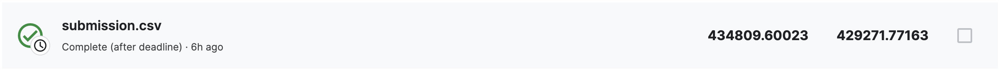